<a href="https://colab.research.google.com/github/Prateekbangwal/machine_learning/blob/master/world_war_2_weather_pred_linear_regression.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [16]:
import pandas as pd
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
%matplotlib inline

In [17]:
data = pd.read_csv('/content/Summary of Weather.csv')

/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:2718: DtypeWarning:

Columns (7,8,18,25) have mixed types.Specify dtype option on import or set low_memory=False.



In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 119040 entries, 0 to 119039
Data columns (total 31 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   STA          119040 non-null  int64  
 1   Date         119040 non-null  object 
 2   Precip       119040 non-null  object 
 3   WindGustSpd  532 non-null     float64
 4   MaxTemp      119040 non-null  float64
 5   MinTemp      119040 non-null  float64
 6   MeanTemp     119040 non-null  float64
 7   Snowfall     117877 non-null  object 
 8   PoorWeather  34237 non-null   object 
 9   YR           119040 non-null  int64  
 10  MO           119040 non-null  int64  
 11  DA           119040 non-null  int64  
 12  PRCP         117108 non-null  object 
 13  DR           533 non-null     float64
 14  SPD          532 non-null     float64
 15  MAX          118566 non-null  float64
 16  MIN          118572 non-null  float64
 17  MEA          118542 non-null  float64
 18  SNF          117877 non-

In [19]:
data.describe()

,STA,WindGustSpd,MaxTemp,MinTemp,MeanTemp,YR,MO,DA,DR,SPD,MAX,MIN,MEA,SND,FT,FB,FTI,ITH,PGT,SD3,RHX,RHN,RVG,WTE
count,119040.000000,532.000000,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000,119040.000000,533.000000,532.000000,118566.000000,118572.000000,118542.000000,5563.0,0.0,0.0,0.0,0.0,525.000000,0.0,0.0,0.0,0.0,0.0
mean,29659.435795,37.774534,27.045111,17.789511,22.411631,43.805284,6.726016,15.797530,26.998124,20.396617,81.003745,64.273808,72.644843,0.0,NaN,NaN,NaN,NaN,12.085333,NaN,NaN,NaN,NaN,NaN
std,20953.209402,10.297808,8.717817,8.334572,8.297982,1.136718,3.425561,8.794541,15.221732,5.560371,14.869361,14.481498,14.211082,0.0,NaN,NaN,NaN,NaN,5.731328,NaN,NaN,NaN,NaN,NaN
min,10001.000000,18.520000,-33.333333,-38.333333,-35.555556,40.000000,1.000000,1.000000,2.000000,10.000000,-28.000000,-37.000000,-32.000000,0.0,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN
25%,11801.000000,29.632000,25.555556,15.000000,20.555556,43.000000,4.000000,8.000000,11.000000,16.000000,78.000000,59.000000,69.000000,0.0,NaN,NaN,NaN,NaN,8.500000,NaN,NaN,NaN,NaN,NaN
50%,22508.000000,37.040000,29.444444,21.111111,25.555556,44.000000,7.000000,16.000000,32.000000,20.000000,85.000000,70.000000,78.000000,0.0,NaN,NaN,NaN,NaN,11.600000,NaN,NaN,NaN,NaN,NaN
75%,33501.000000,43.059000,31.666667,23.333333,27.222222,45.000000,10.000000,23.000000,34.000000,23.250000,89.000000,74.000000,81.000000,0.0,NaN,NaN,NaN,NaN,15.000000,NaN,NaN,NaN,NaN,NaN
max,82506.000000,75.932000,50.000000,34.444444,40.000000,45.000000,12.000000,31.000000,78.000000,41.000000,122.000000,94.000000,104.000000,0.0,NaN,NaN,NaN,NaN,23.900000,NaN,NaN,NaN,NaN,NaN


In [20]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [21]:
fig = px.histogram(data,
                   x = 'MinTemp',
                   marginal = 'box',
                   title = "Min Temp")
fig.update_layout(bargap = 0.1)
fig.show()

In [22]:
fig = px.histogram(data,
                   x = 'MaxTemp',
                   marginal = 'box',
                   title = "Max Temp",
                   color_discrete_sequence = ['red'])
fig.update_layout(bargap = 0.1)
fig.show()

In [23]:
data["Precip"] = data['Precip'].replace('T', 0)

In [24]:
data.head(10)

,STA,Date,Precip,WindGustSpd,MaxTemp,MinTemp,MeanTemp,Snowfall,PoorWeather,YR,MO,DA,PRCP,DR,SPD,MAX,MIN,MEA,SNF,SND,FT,FB,FTI,ITH,PGT,TSHDSBRSGF,SD3,RHX,RHN,RVG,WTE
0,10001,1942-7-1,1.016,NaN,25.555556,22.222222,23.888889,0,NaN,42,7,1,0.04,NaN,NaN,78.0,72.0,75.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10001,1942-7-2,0,NaN,28.888889,21.666667,25.555556,0,NaN,42,7,2,0,NaN,NaN,84.0,71.0,78.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001,1942-7-3,2.54,NaN,26.111111,22.222222,24.444444,0,NaN,42,7,3,0.1,NaN,NaN,79.0,72.0,76.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001,1942-7-4,2.54,NaN,26.666667,22.222222,24.444444,0,NaN,42,7,4,0.1,NaN,NaN,80.0,72.0,76.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10001,1942-7-5,0,NaN,26.666667,21.666667,24.444444,0,NaN,42,7,5,0,NaN,NaN,80.0,71.0,76.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,10001,1942-7-6,0,NaN,26.666667,21.666667,24.444444,0,NaN,42,7,6,0,NaN,NaN,80.0,71.0,76.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,10001,1942-7-7,0,NaN,28.333333,22.777778,25.555556,0,NaN,42,7,7,T,NaN,NaN,83.0,73.0,78.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,10001,1942-7-8,3.556,NaN,26.666667,22.222222,24.444444,0,NaN,42,7,8,0.14,NaN,NaN,80.0,72.0,76.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,10001,1942-7-9,0,NaN,27.222222,22.777778,25.000000,0,NaN,42,7,9,T,NaN,NaN,81.0,73.0,77.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,10001,1942-7-10,3.556,NaN,25.555556,21.666667,23.333333,0,NaN,42,7,10,0.14,NaN,NaN,78.0,71.0,74.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [29]:
fig = px.scatter(data,
                 x='MaxTemp',
                 y = 'Precip',
                 opacity = 0.8,
                 title = 'Precip VS MaxTemp')
fig.update_traces(marker_size = 10)
fig.show()

In [30]:
fig = px.scatter(data,
                 x='MinTemp',
                 y = 'Precip',
                 opacity = 0.8,
                 title = 'Precip VS MinTemp')
fig.update_traces(marker_size = 10)
fig.show()

In [31]:
fig = px.scatter(data,
                 x='MinTemp',
                 y = 'Snowfall',
                 opacity = 0.8,
                 title = 'Snowfall VS MinTemp')
fig.update_traces(marker_size = 10)
fig.show()

In [43]:

data['Snowfall'] = data['Snowfall'].fillna(0).astype('float')
data['Snowfall'] = data['Snowfall'].replace('#VALUE!', 0)


data.Snowfall.dtype
print(data.MinTemp.corr(data.Snowfall))

-0.3078536914032262


In [45]:
data = data[['MinTemp', 'MaxTemp', 'Precip', 'Snowfall']]

Text(0.5, 1.0, 'Correlation Matrix')

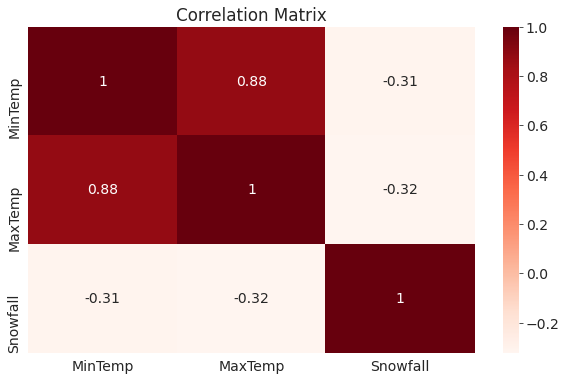

In [46]:
sns.heatmap(data.corr(), cmap = 'Reds', annot = True)
plt.title('Correlation Matrix')

In [47]:
y =data['MaxTemp']
X = data.drop(columns=['MaxTemp'])
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test =train_test_split(X,y,test_size =0.2,random_state=0)

In [48]:
X_train, y_train

(          MinTemp Precip  Snowfall
 36004   22.222222      0      0.00
 116838  17.777778      0      0.00
 46809   -9.444444      0      5.08
 109656  22.222222  20.32      0.00
 61397   18.888889      0      0.00
 ...           ...    ...       ...
 45891   -1.666667   2.54      0.00
 117952  19.444444      0      0.00
 42613    3.333333      0      0.00
 43567   10.000000      0      0.00
 68268   15.555556  2.032      0.00
 
 [95232 rows x 3 columns], 36004     27.222222
 116838    32.777778
 46809      8.888889
 109656    31.666667
 61397     35.000000
             ...    
 45891      5.000000
 117952    32.222222
 42613      4.444444
 43567     14.444444
 68268     21.111111
 Name: MaxTemp, Length: 95232, dtype: float64)

In [49]:
def rmse(targets, predictions):
  return np.sqrt(np.mean(np.square(targets - predictions)))

In [50]:
from sklearn.linear_model import LinearRegression
model = LinearRegression().fit(X_train, y_train)
predictions = model.predict(X_train)
loss = rmse(y_train, predictions)
print('loss:', loss)

loss: 4.083915126511944


In [51]:
predictions

array([31.29862481, 27.25606011,  1.5896289 , ..., 14.11772485,
       20.18157189, 25.11624786])

In [53]:
y_pred= model.predict(X_test)
print(y_pred)

[33.82522774 30.28798363 26.27661989 ... 32.81458657 30.76367175
 31.8039454 ]


In [54]:
loss = rmse(y_test, y_pred)
print('loss:', loss)

loss: 4.120167118080949


In [55]:
from sklearn.metrics import r2_score
r2_score(y_pred,y_test)

0.7143589538694337

In [57]:
print(y_test)
print(y_pred)

21441     28.888889
5719      31.111111
52102     27.222222
8775      28.888889
88657     23.333333
            ...    
102987    32.777778
32667     32.222222
60884     31.111111
2337      31.111111
27141     36.666667
Name: MaxTemp, Length: 23808, dtype: float64
[33.82522774 30.28798363 26.27661989 ... 32.81458657 30.76367175
 31.8039454 ]
